In [ ]:
a!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
!gcc --version
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 646kB/s 
     |████████████████████████████████| 2.2MB 4.0MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201103-cp36-none-any.whl size=44309 sha256=d4662ddbe2fd9f1728b1c244c669a8fc73b5d0dfcbcd92323d04eee5fbe67d24
  Stored in directory: /root/.cache/pip/wheels/9e/69/d8/9f4458580817c37c0b844fd4f20379a29c314ef50332d0379e
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [ ]:
#從google drive讀取標記好的口罩檔案進行訓練
#口罩影像檔必須符合coco format
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#解壓縮檔案到colab端 的/dev/null目錄
!unzip "/content/drive/My Drive/AI/mask_coco_853.zip" > /dev/null

In [ ]:
#將/mask_coco_853的目錄改名成/mask
!mv mask_coco_853 mask

In [ ]:
import detectron2
import numpy as np
import json
import cv2
import random
import os

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data import DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import ColorMode

from matplotlib import pyplot as plt

In [ ]:
from detectron2.data.datasets import register_coco_instances
#register_coco_instances("mask", {}, "./mask/label_46_coco.json", "./mask")
#將/mask目錄下的coco json檔案進行註冊
register_coco_instances("mask", {}, "./mask/_annotations.coco.json", "./mask")



In [ ]:
#將註冊好的mask metadata取出來列印，看是否真的註冊mask類別成功
mask_metadata = MetadataCatalog.get("mask")


In [ ]:
mask_metadata

Metadata(evaluator_type='coco', image_root='./mask', json_file='./mask/_annotations.coco.json', name='mask')

In [ ]:
DatasetCatalog.list()

['coco_2014_train',
 'coco_2014_val',
 'coco_2014_minival',
 'coco_2014_minival_100',
 'coco_2014_valminusminival',
 'coco_2017_train',
 'coco_2017_val',
 'coco_2017_test',
 'coco_2017_test-dev',
 'coco_2017_val_100',
 'keypoints_coco_2014_train',
 'keypoints_coco_2014_val',
 'keypoints_coco_2014_minival',
 'keypoints_coco_2014_valminusminival',
 'keypoints_coco_2014_minival_100',
 'keypoints_coco_2017_train',
 'keypoints_coco_2017_val',
 'keypoints_coco_2017_val_100',
 'coco_2017_train_panoptic_separated',
 'coco_2017_train_panoptic_stuffonly',
 'coco_2017_val_panoptic_separated',
 'coco_2017_val_panoptic_stuffonly',
 'coco_2017_val_100_panoptic_separated',
 'coco_2017_val_100_panoptic_stuffonly',
 'lvis_v1_train',
 'lvis_v1_val',
 'lvis_v1_test_dev',
 'lvis_v1_test_challenge',
 'lvis_v0.5_train',
 'lvis_v0.5_val',
 'lvis_v0.5_val_rand_100',
 'lvis_v0.5_test',
 'lvis_v0.5_train_cocofied',
 'lvis_v0.5_val_cocofied',
 'cityscapes_fine_instance_seg_train',
 'cityscapes_fine_sem_seg_train

In [ ]:
#確認mask dataset的訓練影像資料數量是否正確
dataset_dicts = DatasetCatalog.get('mask')
print(len(dataset_dicts))

848


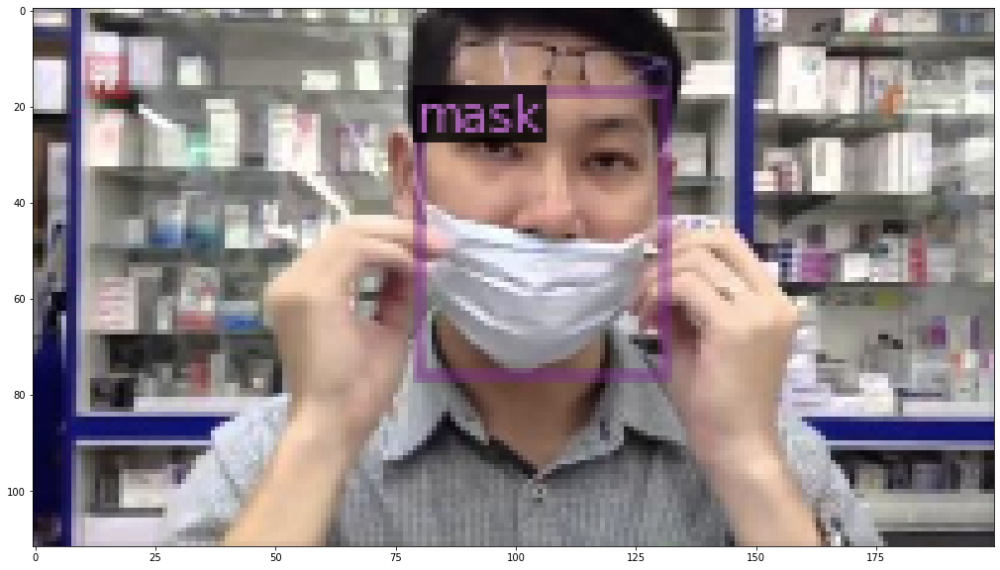

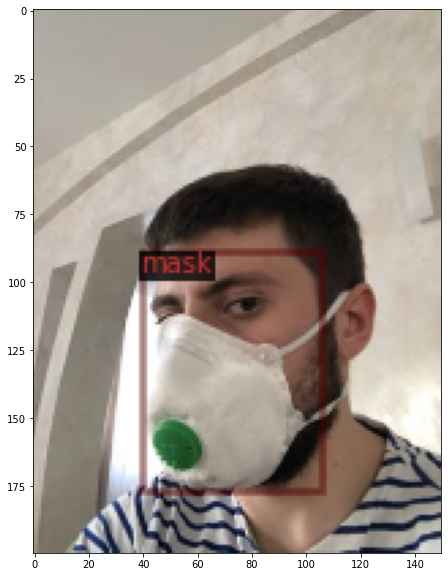

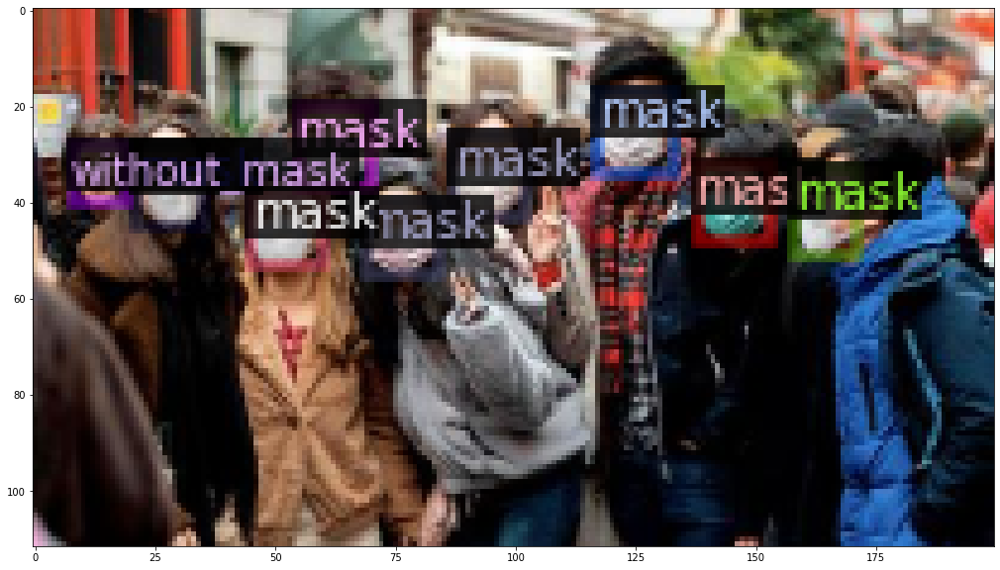

In [ ]:
#從影像資料庫找出3張影像以及標籤進行瀏覽
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=mask_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(20,10))
    plt.imshow(vis.get_image())

In [ ]:
#開始針對mask類別進行訓練
cfg = get_cfg()
#從detectron2讀取faster_rcnn_R_50的設定檔進行訓練
#detectron2有哪些設定檔可以選擇，可以參考detectron2的github
#https://github.com/facebookresearch/detectron2/tree/master/configs/COCO-Detection
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
#指定訓練類別
cfg.DATASETS.TRAIN = ("mask",)
#沒有測試的類別，也要指定成空值
cfg.DATASETS.TEST = ()
#要幾個data loader進行訓練，可隨意設定
cfg.DATALOADER.NUM_WORKERS = 2
#讀取detectron2訓練過的權重檔案來當作預設權重
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
#由於本訓練資料有兩類(mask跟no_mask)，所以num_classes=2
#如果訓練資料只有一類(mask)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 
#設定檔儲存的位置
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[11/03 16:17:38 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:11, 14.9MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.


[11/03 16:17:55 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[11/03 16:18:01 d2.utils.events]:  eta: 0:05:10  iter: 19  total_loss: 1.439  loss_cls: 1.134  loss_box_reg: 0.089  loss_rpn_cls: 0.184  loss_rpn_loc: 0.043  time: 0.3151  data_time: 0.0166  lr: 0.000005  max_mem: 2732M
[11/03 16:18:08 d2.utils.events]:  eta: 0:05:02  iter: 39  total_loss: 1.352  loss_cls: 1.038  loss_box_reg: 0.090  loss_rpn_cls: 0.175  loss_rpn_loc: 0.052  time: 0.3137  data_time: 0.0068  lr: 0.000010  max_mem: 2732M
[11/03 16:18:14 d2.utils.events]:  eta: 0:04:53  iter: 59  total_loss: 1.142  loss_cls: 0.879  loss_box_reg: 0.116  loss_rpn_cls: 0.125  loss_rpn_loc: 0.037  time: 0.3114  data_time: 0.0099  lr: 0.000015  max_mem: 2732M
[11/03 16:18:20 d2.utils.events]:  eta: 0:04:46  iter: 79  total_loss: 0.869  loss_cls: 0.670  loss_box_reg: 0.103  loss_rpn_cls: 0.068  loss_rpn_loc: 0.025  time: 0.3093  data_time: 0.0090  lr: 0.000020  max_mem: 2732M
[11/03 16:18:26 d2.utils.events]:  eta: 0:04:38  iter: 99  total_loss: 0.761  loss_cls: 0.511  loss_box_reg: 0.125  loss

In [ ]:
#利用tensorboard來監看訓練的狀況
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
#毒入訓練出來新的權重檔案，進行新圖片的預測
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
#設定權重
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   
predictor = DefaultPredictor(cfg)
val_dicts = DatasetCatalog.get('mask')


[11/03 16:30:42 d2.data.datasets.coco]: Loaded 848 images in COCO format from ./mask/_annotations.coco.json


In [ ]:
#利用opencv來秀要測試的圖
import cv2
from google.colab.patches import cv2_imshow
#下載測試圖(可自行更改)，並統一改名為input.jpg
!wget https://heho.com.tw/wp-content/uploads/2020/01/%E5%8F%A3%E7%BD%A9.png -q -O input.jpg

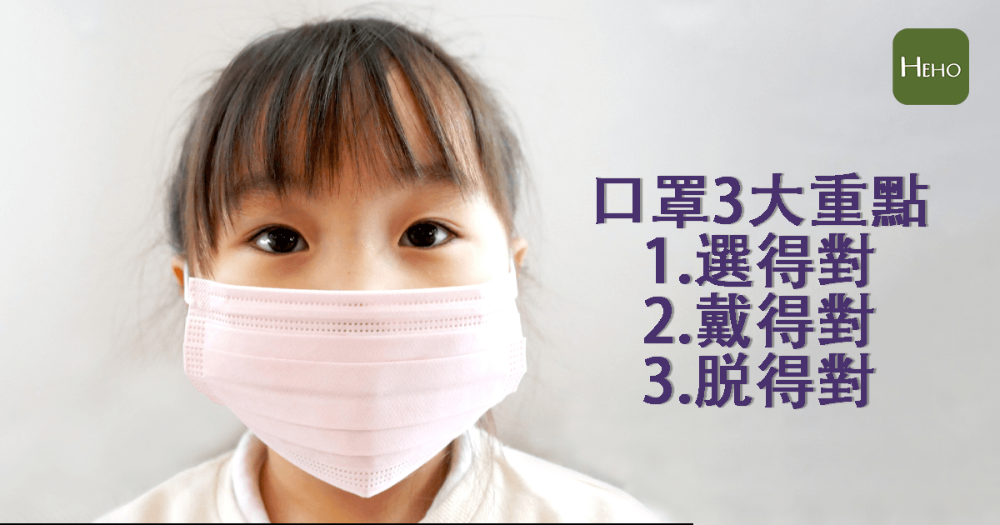

In [ ]:

im = cv2.imread("./input.jpg")
cv2_imshow(im)

In [ ]:
#進行預測
outputs = predictor(im)

In [ ]:
#把預測結果印出來看
#有預測到0類別(mask)，跟一組預測方塊
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([0], device='cuda:0')
Boxes(tensor([[223.7709, 205.4914, 591.7094, 602.3772]], device='cuda:0'))


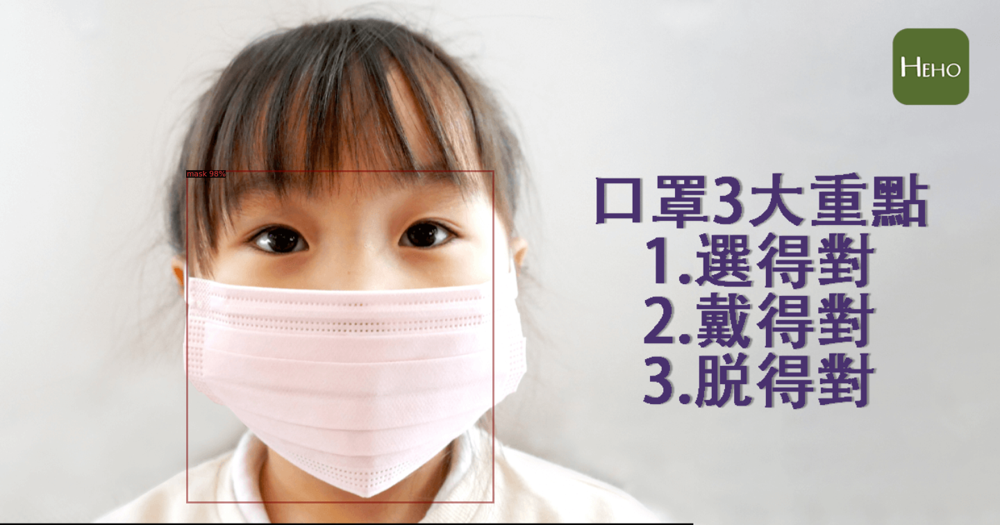

In [ ]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

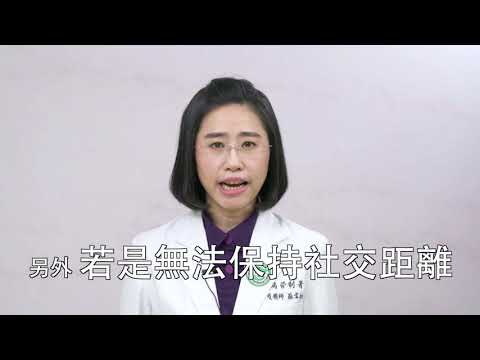

In [ ]:
#顯示測試影片
from IPython.display import YouTubeVideo, display
#video = YouTubeVideo("ll8TgCZ0plk", width=500)
#video = YouTubeVideo("3PEfQn2WVk0", width=500)
#video = YouTubeVideo("5BiiNkvEg1c", width=500)
video = YouTubeVideo("KV0SHB1I_j4", width=500)
display(video)

In [ ]:
#利用youtube-dl下載測試影片並改名為video.mp4
#可自行設定要測試的影片

!pip install youtube-dl
!pip uninstall -y opencv-python-headless opencv-contrib-python
!apt install python3-opencv  # the one pre-installed have some issues
#!youtube-dl https://www.youtube.com/watch?v=ll8TgCZ0plk -f 22 -o video.mp4
#!youtube-dl https://www.youtube.com/watch?v=5BiiNkvEg1c -f mp4 -o video.mp4
#!youtube-dl https://www.youtube.com/watch?v=QbWsF_IWHGw  -f mp4 -o video.mp4
!youtube-dl https://www.youtube.com/watch?v=KV0SHB1I_j4  -f mp4 -o video.mp4

#!ffmpeg -i video.mp4 -t 00:00:06 -c:v copy video-clip.mp4


Reading package lists... Done
Building dependency tree       
Reading state information... Done
python3-opencv is already the newest version (3.2.0+dfsg-4ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 11 not upgraded.
[youtube] KV0SHB1I_j4: Downloading webpage
[youtube] KV0SHB1I_j4: Downloading MPD manifest
[download] Destination: video.mp4
[download] 100% of 14.57MiB in 00:01


In [ ]:
#執行完畢後，可以下載out.mp4觀看預測結果
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import numpy as np
import tqdm
import cv2
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog
import time

# Extract video properties
video = cv2.VideoCapture('video.mp4')
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Initialize video writer
video_writer = cv2.VideoWriter('out.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

# Initialize predictor
#cfg = get_cfg()
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
#cfg.MODEL.WEIGHTS = "/content/drive/My Drive/AI/mask_46_maskrcnn_model_final.pth"
#cfg.MODEL.WEIGHTS = "/content/drive/My Drive/AI/mask_600_fast_model_final.pth"

#predictor = DefaultPredictor(cfg)
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
# Initialize visualizer
v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), ColorMode.IMAGE)

def runOnVideo(video, maxFrames):
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """

    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Get prediction results for this frame
        outputs = predictor(frame)

        # Make sure the frame is colored
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Draw a visualization of the predictions using the video visualizer
        visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))

        # Convert Matplotlib RGB format to OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break

# Create a cut-off for debugging
#num_frames = 1200

# Enumerate the frames of the video
for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

    # Write test image
    cv2.imwrite('POSE detectron2.png', visualization)

    # Write to video file
    video_writer.write(visualization)

# Release resources
video.release()
video_writer.release()
cv2.destroyAllWindows()


100%|██████████| 1806/1806 [07:53<00:00,  3.81it/s]


以下使用detectron2 的demo.py來進行預測
需要更改demo.py裡面的程式，設定cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 後才可以正常運作

In [ ]:
!git clone https://github.com/facebookresearch/detectron2
#!python detectron2/demo/demo.py --config-file detectron2/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml --video-input video-clip.mp4 --confidence-threshold 0.6 --output video-output.mkv \
#  --opts MODEL.WEIGHTS detectron2://COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl

Cloning into 'detectron2'...
remote: Enumerating objects: 7946, done.
remote: Total 7946 (delta 0), reused 0 (delta 0), pack-reused 7946
Receiving objects: 100% (7946/7946), 3.48 MiB | 5.58 MiB/s, done.
Resolving deltas: 100% (5689/5689), done.


In [ ]:
#讀取video-output.mkv觀看結果
!python detectron2/demo/demo.py --config-file detectron2/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml --video-input video.mp4 --confidence-threshold 0.6 --output video-output.mkv \
  --opts MODEL.WEIGHTS "output/model_final.pth"

Failed to load OpenCL runtime
[11/02 13:26:00 detectron2]: Arguments: Namespace(confidence_threshold=0.6, config_file='detectron2/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml', input=None, opts=['MODEL.WEIGHTS', 'output/model_final.pth'], output='video-output.mkv', video_input='video.mp4', webcam=False)
[11/02 13:26:04 fvcore.common.checkpoint]: Loading checkpoint from output/model_final.pth
WARNING [11/02 13:26:04 fvcore.common.checkpoint]: Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (2, 1024) in the checkpoint but (81, 1024) in the model! You might want to double check if this is expected.
WARNING [11/02 13:26:04 fvcore.common.checkpoint]: Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (2,) in the checkpoint but (81,) in the model! You might want to double check if this is expected.
WARNING [11/02 13:26:04 fvcore.common.checkpoint]: Skip loading parameter 'r